# **Question:** How can we integrate the pairwise retention time (RT) differences for the "edge-features"? 

## Joint features associated with the edges

### Using the signum of the retention time differences

The Structured Support Vector Machine (SSVM) framework models the joint features of the retention times (RT) and the candidate molecules as follows: 

$$
\Gamma(\mathbf{t}^{\sigma\tau},\mathbf{y}^{\sigma\tau})=\mathtt{sign}(t_\sigma-t_\tau)\left(\phi(y_\sigma)-\phi(y_\tau)\right),
$$

with:
- $t_\sigma,t_\tau\in\mathbb{R}$ being the RTs of two MS-features
- $\phi(y_\sigma),\phi(y_\tau)\in\mathcal{F}_\mathcal{Y}$ being the molecule features of two molecular candidates associated with the respective MS-features

The $\mathtt{sign}$ function abstracts from the actual RTs to retention orders. This allows us to consider MS-feature pairs measured under heterogenouse liquid chromatographic (LC) conditions. 

### Joint prediction 

Given an SSVM model $w\in\mathcal{F}_\mathcal{Y}$ we can calculate a score for the two candidate structures $y_\sigma,y_\tau$ and two RTs $t_\sigma,t_\tau$ like:

$$
\Gamma(\mathbf{t}^{\sigma\tau},\mathbf{y}^{\sigma\tau})=\mathtt{sign}(t_\sigma-t_\tau)\langle w, \left(\phi(y_\sigma)-\phi(y_\tau)\right)\rangle.
$$

Note, that the SSVM model is trained such that the correct candidate structures are scoring high, i.e the RT difference sign and feature vector difference (sign) aggree. 

### Joint feature similarity

We train the SSVM in the dual space, which means that we, instead of using the RT differences and molecule feature vectors directly, use the kernelized similarities between them. In practice, for the (sign) RT differences we apply a linear kernel and for the molecule features we can use a histogram-intersection kernel on molecular fingerprints: 

$$
\kappa((\mathbf{t}^{\sigma\tau},\mathbf{y}^{\sigma\tau}), (\bar{\mathbf{t}}^{\bar{\sigma}\bar{\tau}},\bar{\mathbf{y}}^{\bar{\sigma}\bar{\tau}})) = \langle\Gamma(\mathbf{t}^{\sigma\tau},\mathbf{y}^{\sigma\tau}),\Gamma(\bar{\mathbf{t}}^{\bar{\sigma}\bar{\tau}},\bar{\mathbf{y}}^{\bar{\sigma}\bar{\tau}})\rangle = \mathtt{sign}(t_\sigma-t_\tau)\mathtt{sign}(\bar{t}_\bar{\sigma}-\bar{t}_\bar{\tau})\cdot\langle\left(\phi(y_\sigma)-\phi(y_\tau)\right),\left(\phi(\bar{y}_\bar{\sigma})-\phi(\bar{y}_\bar{\tau})\right)\rangle.
$$

In [3]:
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools as it
import scipy.stats as sp_stats

from sklearn.model_selection import KFold, ShuffleSplit
from sklearn.metrics import r2_score, mean_squared_error

In [63]:
# DB connections
DB_FN_FULL = "../db/massbank__only_normalized_scores.sqlite"
DB_URI_FULL = "file:" + DB_FN_FULL + "?mode=ro"
DB_CONN_FULL_RO = sqlite3.connect(DB_URI_FULL, uri=True)

# Define some SQLite queries 
LOAD_RTS_FOR_DATASET = \
    "SELECT molecule, retention_time FROM scored_spectra_meta s" \
    "   INNER JOIN datasets d ON d.name = s.dataset" \
    "   WHERE dataset IS '%s'" \
    "     AND retention_time >= 3 * column_dead_time_min" 

LOAD_MAX_RT_FOR_DATASET = "SELECT max(retention_time) FROM scored_spectra_meta WHERE dataset IS '%s'"

LOAD_MAX_GRAD_TIME_FOR_DATASET = "SELECT max_gradient_time FROM datasets WHERE name IS '%s'"

# Preserved retention orders between the MassBank datasets

Our $\mathtt{sign}$ based joint feature relies on the preservation of the retention orders of molecules under different LC configurations (though limited to, e.g., reversed phase systems). 

We can emperically inspect this assumption for all the MassBank data by looking at the molecule intersection (and their RTs) between the datasets:

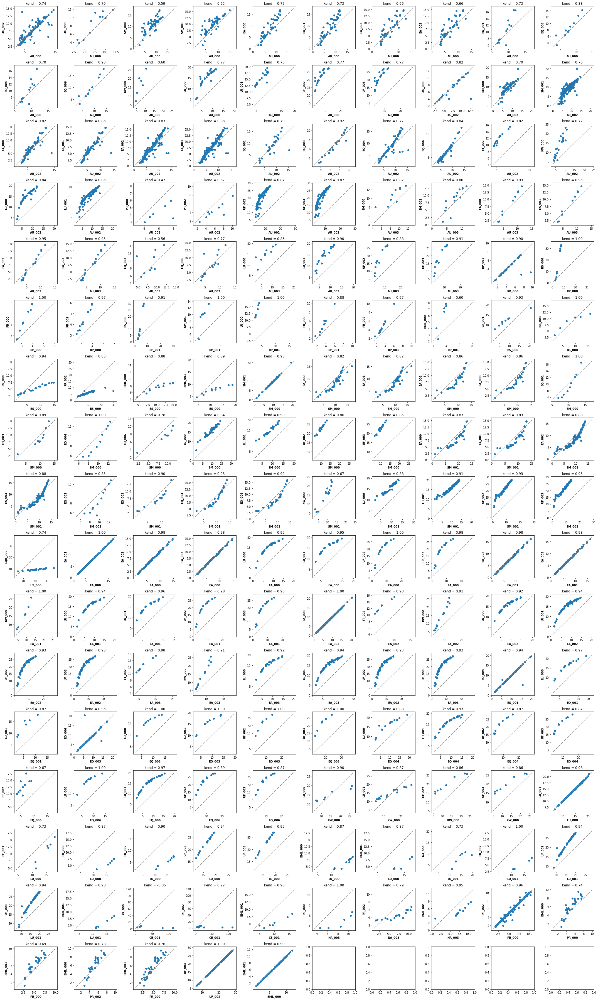

In [19]:
datasets, = zip(
    *DB_CONN_FULL_RO.execute("SELECT name FROM datasets WHERE column_type IS 'RP'").fetchall()
)  # load reversed phase (RP) datasets

n_cols = 10
n_rows = 17

fig, axrr = plt.subplots(n_rows, n_cols, figsize=(30, 50)) 

idx = 0

df_kend = []

for d1, d2 in it.combinations(datasets, 2):    
    df = pd.merge(
        pd.read_sql(LOAD_RTS_FOR_DATASET % d1, DB_CONN_FULL_RO),
        pd.read_sql(LOAD_RTS_FOR_DATASET % d2, DB_CONN_FULL_RO),
        on="molecule"
    )

    if len(df) > 5:
        df_kend.append([d1, d2, sp_stats.kendalltau(df["retention_time_x"], df["retention_time_y"])[0]])
        
        r, c = np.unravel_index(idx, axrr.shape)
        axrr[r, c].scatter(df["retention_time_x"], df["retention_time_y"])
        axrr[r, c].set_xlabel(d1, fontweight="bold")
        axrr[r, c].set_ylabel(d2, fontweight="bold")
        axrr[r, c].set_title("kend = %.2f" % df_kend[-1][2])
        
        _x_min, _x_max = axrr[r, c].get_xlim()
        _y_min, _y_max = axrr[r, c].get_ylim()
        axrr[r, c].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )
        idx += 1
        
plt.tight_layout()

df_kend = pd.DataFrame(df_kend, columns=["dataset_1", "dataset_2", "kendalstau"])

The scatter plots show a that the retention orders are fairly well preserved in between the datasets. A measure of preserved retention order is shown for each scatter plot (Kendall's Tau rank correlation). Nevertheless, the actual relation between the RTs shows a non-linear pattern for many of the intersections which differs significantly between dataset pairs. 

Text(0.5, 0, "Kendall's Tau (rank correlation)")

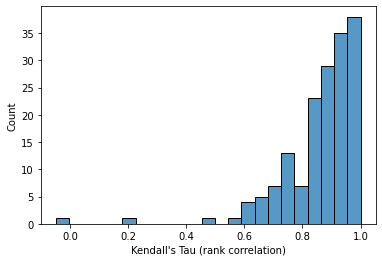

In [18]:
ax = sns.histplot(df_kend, legend=False)
ax.set_xlabel("Kendall's Tau (rank correlation)")

The histrogram plot shows that for the majority of the dataset pairs, the rank correlation is above 0.8.

# Going from retention orders to retention time *differences*

From the scatter plots above it is evenident that the RTs of two datasets (~ difference LC configurations) cannot be easily transfered. **Q** But how about RT differences?  

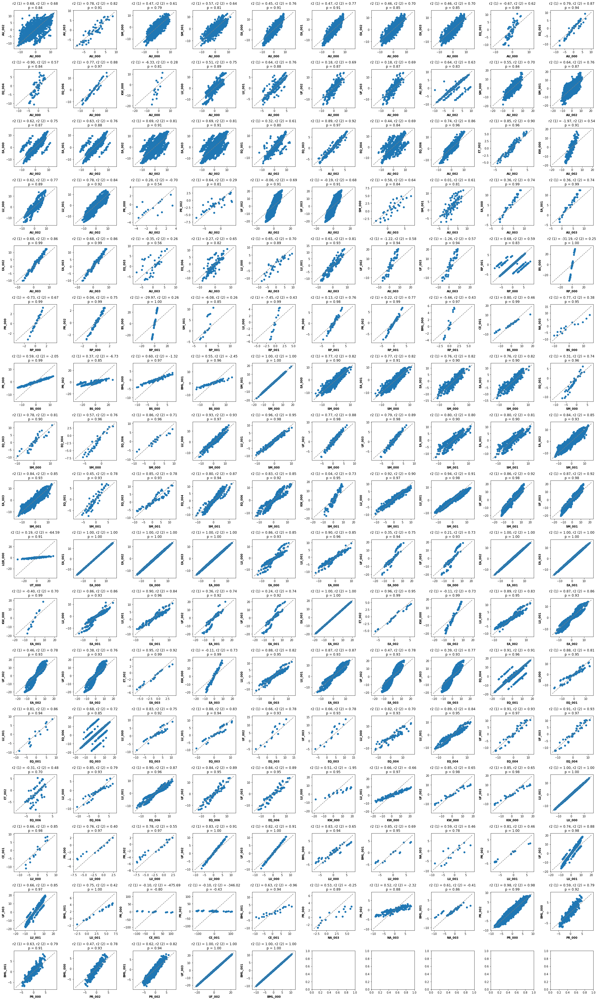

In [84]:
datasets, = zip(
    *DB_CONN_FULL_RO.execute("SELECT name FROM datasets WHERE column_type IS 'RP'").fetchall()
)  # load reversed phase (RP) datasets

n_cols = 10
n_rows = 17

fig, axrr = plt.subplots(n_rows, n_cols, figsize=(30, 50)) 

idx = 0

df_agreement = []

for d1, d2 in it.combinations(datasets, 2):    
    df = pd.merge(
        pd.read_sql(LOAD_RTS_FOR_DATASET % d1, DB_CONN_FULL_RO),
        pd.read_sql(LOAD_RTS_FOR_DATASET % d2, DB_CONN_FULL_RO),
        on="molecule"
    )

    if len(df) > 5:
        RT_X_DIFF = df["retention_time_x"].values[:, np.newaxis] - df["retention_time_x"].values[np.newaxis, :]
        RT_Y_DIFF = df["retention_time_y"].values[:, np.newaxis] - df["retention_time_y"].values[np.newaxis, :]
        
        # We only need to consider each pair ones
        RT_X_DIFF = RT_X_DIFF[np.tril_indices_from(RT_X_DIFF, -1)]  
        RT_Y_DIFF = RT_Y_DIFF[np.tril_indices_from(RT_Y_DIFF, -1)]  
        
        # The R2 score is not symmetric. We therefore add the score here twice
        df_agreement.append([d1, d2, "unnorm", "r2_score", r2_score(RT_X_DIFF, RT_Y_DIFF)])
        df_agreement.append([d2, d1, "unnorm", "r2_score", r2_score(RT_Y_DIFF, RT_X_DIFF)])
        df_agreement.append([d1, d2, "unnorm", "pearsonr", sp_stats.pearsonr(RT_X_DIFF, RT_Y_DIFF)[0]])
        df_agreement.append([d1, d2, "unnorm", "mse", mean_squared_error(RT_X_DIFF, RT_Y_DIFF)])
        
        r, c = np.unravel_index(idx, axrr.shape)
        axrr[r, c].scatter(RT_X_DIFF, RT_Y_DIFF)
        axrr[r, c].set_xlabel(d1, fontweight="bold")
        axrr[r, c].set_ylabel(d2, fontweight="bold")
        axrr[r, c].set_title("r2 (1) = %.2f, r2 (2) = %.2f\np = %.2f" % (df_agreement[-4][4], df_agreement[-3][4], df_agreement[-2][4]))
        
        _x_min, _x_max = axrr[r, c].get_xlim()
        _y_min, _y_max = axrr[r, c].get_ylim()
        axrr[r, c].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )
        idx += 1
        
plt.tight_layout()

df_agreement = pd.DataFrame(df_agreement, columns=["dataset_1", "dataset_2", "rt_diff", "measure", "value"])

For many of the dataset pairs the scatter plots show a quite correlation (Pearson correlation is indicated in the plot titles), but the R$^2$-score ($\in(-\infty,1]$) takes on quite low values. This indicates, that the RT differences of one system not necessarily are well predicting the RT differences in another system. On reason for that can be that the RT ranges of the different datasets can be very different.

Text(0.5, 0, 'R2 Score')

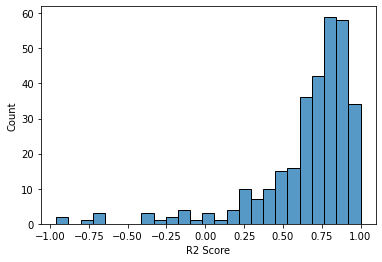

In [60]:
ax = sns.histplot(data=df_agreement[(df_agreement["measure"] == "r2_score") & (df_agreement["value"] >= -1)]["value"])
ax.set_xlabel("R2 Score")

### Normalize RT differences by the gradient time

Next we look what happens, if we normalize the RT differences by the gradient times. I extracted the gradient times from the meta-data of the MassBank DB. It serves me as approximated maximum observable RT. So, let us look how the gradient times correlate with the maximum observed RTs.

Text(0, 0.5, 'Maximum retention time')

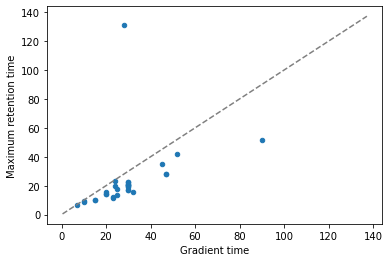

In [53]:
ax = pd.read_sql(
    "SELECT dataset, max_gradient_time, max(retention_time) AS max_rt FROM datasets"
    "   INNER JOIN scored_spectra_meta ssm ON datasets.name = ssm.dataset"
    "   WHERE column_type IS 'RP'"
    "   GROUP BY dataset",
    con=DB_CONN_FULL_RO
).plot(kind="scatter", x="max_gradient_time", y="max_rt")

_x_min, _x_max = ax.get_xlim()
_y_min, _y_max = ax.get_ylim()
ax.plot(
    [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
    [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
    linestyle="--", color="gray"
)
ax.set_xlabel("Gradient time")
ax.set_ylabel("Maximum retention time")

The gradient time (extracted from the meta-data) and the maximum observed RT correlate well. The gradient time gives an upper bound on the maximum observed RT. The only exception is the "CE_000" dataset, where the maximum observed RT is by far larger than the gradient time. I attribute this to an error in the DB (RTs of more than 2h (!) seem unlikely to me). 

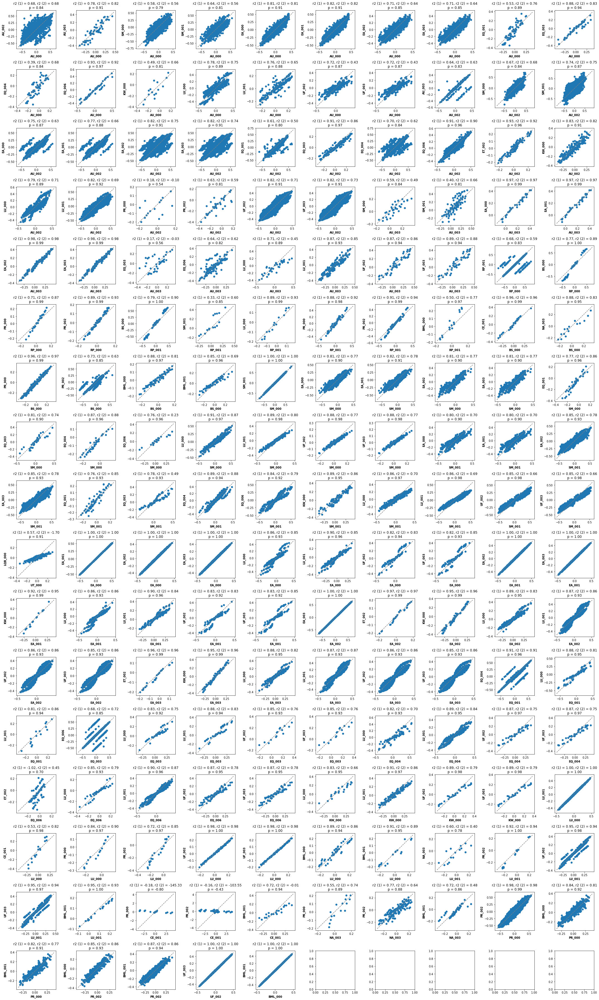

In [83]:
datasets, = zip(
    *DB_CONN_FULL_RO.execute("SELECT name FROM datasets WHERE column_type IS 'RP'").fetchall()
)  # load reversed phase (RP) datasets

n_cols = 10
n_rows = 17

fig, axrr = plt.subplots(n_rows, n_cols, figsize=(30, 50)) 

idx = 0

df_agreement_2 = []

for d1, d2 in it.combinations(datasets, 2):    
    df = pd.merge(
        pd.read_sql(LOAD_RTS_FOR_DATASET % d1, DB_CONN_FULL_RO),
        pd.read_sql(LOAD_RTS_FOR_DATASET % d2, DB_CONN_FULL_RO),
        on="molecule"
    )

    if len(df) > 5:
        RT_X_DIFF = df["retention_time_x"].values[:, np.newaxis] - df["retention_time_x"].values[np.newaxis, :]
        RT_Y_DIFF = df["retention_time_y"].values[:, np.newaxis] - df["retention_time_y"].values[np.newaxis, :]
        
        GT1 = DB_CONN_FULL_RO.execute(LOAD_MAX_GRAD_TIME_FOR_DATASET % d1).fetchone()[0]
        GT2 = DB_CONN_FULL_RO.execute(LOAD_MAX_GRAD_TIME_FOR_DATASET % d2).fetchone()[0]
        
        # We only need to consider each pair ones
        RT_X_DIFF = RT_X_DIFF[np.tril_indices_from(RT_X_DIFF, -1)] / GT1
        RT_Y_DIFF = RT_Y_DIFF[np.tril_indices_from(RT_Y_DIFF, -1)] / GT2
        
        # The R2 score is not symmetric. We therefore add the score here twice
        df_agreement_2.append([d1, d2, "unnorm", "r2_score", r2_score(RT_X_DIFF, RT_Y_DIFF)])
        df_agreement_2.append([d2, d1, "unnorm", "r2_score", r2_score(RT_Y_DIFF, RT_X_DIFF)])
        df_agreement_2.append([d1, d2, "unnorm", "pearsonr", sp_stats.pearsonr(RT_X_DIFF, RT_Y_DIFF)[0]])
        df_agreement_2.append([d1, d2, "unnorm", "mse", mean_squared_error(RT_X_DIFF, RT_Y_DIFF)])
        
        r, c = np.unravel_index(idx, axrr.shape)
        axrr[r, c].scatter(RT_X_DIFF, RT_Y_DIFF)
        axrr[r, c].set_xlabel(d1, fontweight="bold")
        axrr[r, c].set_ylabel(d2, fontweight="bold")
        axrr[r, c].set_title(
            "r2 (1) = %.2f, r2 (2) = %.2f\np = %.2f" % (df_agreement_2[-4][4], df_agreement_2[-3][4], df_agreement_2[-2][4])
        )
        
        _x_min, _x_max = axrr[r, c].get_xlim()
        _y_min, _y_max = axrr[r, c].get_ylim()
        axrr[r, c].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )
        idx += 1
        
plt.tight_layout()

df_agreement_2 = pd.DataFrame(df_agreement_2, columns=["dataset_1", "dataset_2", "rt_diff", "measure", "value"])

(-0.1, 1.0)

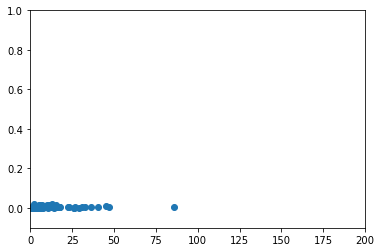

In [81]:
plt.scatter(
    df_agreement[df_agreement["measure"] == "mse"]["value"], 
    df_agreement_2[df_agreement_2["measure"] == "mse"]["value"]
)
ax = plt.gca()
ax.set_xlim([-0.1, 200])df_agreement_2[df_agreement_2["measure"] == "mse"]["value"]

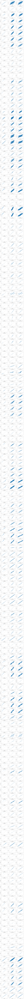

In [89]:
datasets, = zip(
    *DB_CONN_FULL_RO.execute("SELECT name FROM datasets WHERE column_type IS 'RP'").fetchall()
)  # load reversed phase (RP) datasets

n_cols = 3
n_rows = 165

fig, axrr = plt.subplots(n_rows, n_cols, figsize=(15, 600)) 

r = 0

for d1, d2 in it.combinations(datasets, 2):    
    df = pd.merge(
        pd.read_sql(LOAD_RTS_FOR_DATASET % d1, DB_CONN_FULL_RO),
        pd.read_sql(LOAD_RTS_FOR_DATASET % d2, DB_CONN_FULL_RO),
        on="molecule"
    )

    if len(df) > 5:
        axrr[r, 0].scatter(df["retention_time_x"], df["retention_time_y"], alpha=0.25)
        axrr[r, 0].set_xlabel(d1, fontweight="bold")
        axrr[r, 0].set_ylabel(d2, fontweight="bold")
        axrr[r, 0].set_title("RT vs RT (kend=%.2f)" % sp_stats.kendalltau(df["retention_time_x"], df["retention_time_y"])[0])
        _x_min, _x_max = axrr[r, 0].get_xlim()
        _y_min, _y_max = axrr[r, 0].get_ylim()
        axrr[r, 0].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )
        
        RT_X_DIFF = df["retention_time_x"].values[:, np.newaxis] - df["retention_time_x"].values[np.newaxis, :]
        RT_Y_DIFF = df["retention_time_y"].values[:, np.newaxis] - df["retention_time_y"].values[np.newaxis, :]
        
        GT1 = DB_CONN_FULL_RO.execute(LOAD_MAX_GRAD_TIME_FOR_DATASET % d1).fetchone()[0]
        GT2 = DB_CONN_FULL_RO.execute(LOAD_MAX_GRAD_TIME_FOR_DATASET % d2).fetchone()[0]
        
        
        # We only need to consider each pair ones
        RT_X_DIFF = RT_X_DIFF[np.tril_indices_from(RT_X_DIFF, -1)]  
        RT_Y_DIFF = RT_Y_DIFF[np.tril_indices_from(RT_Y_DIFF, -1)]  
        
        axrr[r, 1].scatter(RT_X_DIFF, RT_Y_DIFF, alpha=0.25)
        axrr[r, 1].set_xlabel(d1, fontweight="bold")
        axrr[r, 1].set_ylabel(d2, fontweight="bold")
        axrr[r, 1].set_title(
            "RT diff (r2=%.2f, p=%.2f)" % 
            ((r2_score(RT_X_DIFF, RT_Y_DIFF) + r2_score(RT_Y_DIFF, RT_X_DIFF)) / 2, sp_stats.pearsonr(RT_X_DIFF, RT_Y_DIFF)[0])
        )
        _x_min, _x_max = axrr[r, 1].get_xlim()
        _y_min, _y_max = axrr[r, 1].get_ylim()
        axrr[r, 1].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )
        
        axrr[r, 2].scatter(RT_X_DIFF / GT1, RT_Y_DIFF / GT2, alpha=0.25)
        axrr[r, 2].set_xlabel(d1, fontweight="bold")
        axrr[r, 2].set_ylabel(d2, fontweight="bold")
        axrr[r, 2].set_title(
            "RT diff (r2=%.2f, p=%.2f)" % 
            (
                (r2_score(RT_X_DIFF / GT1, RT_Y_DIFF / GT2) + r2_score(RT_Y_DIFF / GT2, RT_X_DIFF / GT1)) / 2, 
                 sp_stats.pearsonr(RT_X_DIFF / GT1, RT_Y_DIFF / GT2)[0]
            )
        )
        _x_min, _x_max = axrr[r, 2].get_xlim()
        _y_min, _y_max = axrr[r, 2].get_ylim()
        axrr[r, 2].plot(
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)], 
            [np.minimum(_x_min, _y_min), np.maximum(_x_max, _y_max)],
            linestyle="--", color="gray"
        )

        r += 1
        
plt.tight_layout()

### Using normalized retention time differences

The Structured Support Vector Machine (SSVM) framework models the joint features of the retention times (RT) and the candidate molecules as follows: 

$$
\Gamma(\mathbf{t}^{\sigma\tau},\mathbf{y}^{\sigma\tau})=\frac{t_\sigma-t_\tau}{t_\text{Gradient}}\left(\phi(y_\sigma)-\phi(y_\tau)\right),
$$

with:
- $t_\sigma,t_\tau\in\mathbb{R}$ being the RTs of two MS-features
- $\phi(y_\sigma),\phi(y_\tau)\in\mathcal{F}_\mathcal{Y}$ being the molecule features of two molecular candidates associated with the respective MS-features
- $t_\text{gradient}$ is the gradient time associated with the LC system of the MS-features 

The gradient time is used as a proxy for the maximum observable RT in the LC system and used to normalize the RTs. The normalized RTs are roughly from the range $[-1, 1]$. However, if the gradient time is underestatimating the maximum RT the values can be out of this range.

### Changes in the joint feature similarity

If we only look at at the linear kernel similarity between the normalized RT differences we get the following:

$$
\frac{t_\sigma-t_\tau}{t_\text{Gradient}}\cdot\frac{\bar{t}_\bar\sigma-\bar{t}_\bar\tau}{\bar{t}_\text{Gradient}}
$$

Two MS-feature pairs are similar (in terms of their normalized RT difference) if the of the above score is large (signs *and* magnitude agree). 

### Why using normlized RT differences

